Elucidata Assignment - `Pancreatic Cancer Analysis`
==

Task 1 :
--
* What does the analysis say about the general behaviour of the different samples?
* Are the neuroendocrine tumors clearly separable from the adenocarcinoma tumors?
* What can be said about the variance of the PCA?

Task 2:
--
* Can you characterize the presence of IFN signature in pancreatic adenocarcinoma  tumorsby assigning a score to each sample which denotes the positive or negative presence of IFN genes in the sample?
* How is the distribution of this score among the different samples?
* Based on this distribution can we identify the presence of high and low IFN subtypes in PAAD?

Import Some Required `Libraries`

In [1]:
from cmapPy.pandasGEXpress.parse import parse
import numpy as np
import matplotlib.pyplot as plt 
import pandas as pd  
import seaborn as sns
from GSVA import gsva
# Some extras to look at the high dimensional data
from plotnine import *
from sklearn.manifold import TSNE

Load data using `cmappy` 
--

In [2]:
PAAD_multi_data = parse("PAAD.gct", convert_neg_666 = True,make_multiindex = True)
PAAD_multi_data.multi_index_df

participant_id                                                                                aab1  \
sample_type                                                                    Primary solid Tumor   
mRNAseq_cluster                                                                                1.0   
bcr_patient_barcode                                                                   tcga-2j-aab1   
bcr_patient_uuid                                              75119d1a-93e5-4ae7-9d60-69ee929a0772   
vital_status                                                                                  dead   
days_to_death                                                                                66.0    
days_to_last_followup                                                                          NaN   
additional_studies                                                                             NaN   
adenocarcinoma_invasion                                                                        yes   
age_at_initial_pathologic_diagnosis                                                             65   
alcohol_history_documented                                                                     yes   
alcoholic_exposure_category                                                         weekly drinker   
amount_of_alcohol_consumption_per_day                                                          1.0   
anatomic_neoplasm_subdivision                                                     head of pancreas   
anatomic_neoplasm_subdivision_other                                                            NaN   
b_symptoms                                                                                     NaN   
bcr                                                                 nationwide children's hospital   
bcr_aliquot_uuid                                              d3f960b2-c69d-4b64-a30f-72f4fa7bb2f9   
bcr_canonical_reason-2                                                                         NaN   
bcr_canonical_reason-3                                                                         NaN   
bcr_canonical_reason                                                                           NaN   
bcr_followup_barcode                                                                           NaN   
bcr_followup_uuid                                                                              NaN   
bcr_patient_canonical_status                                                             canonical   
clinical_m                                                                                     NaN   
clinical_n                                                                                     NaN   
clinical_stage                                                                                 NaN   
clinical_t                                                                                     NaN   
course_number                                                                                  NaN   
day_of_dcc_upload                                                                               21   
day_of_form_completion                                                                          5    
days_to_birth                                                                               -23962   
days_to_diabetes_onset                                                                         NaN   
days_to_index                                                                                  0.0   
days_to_initial_pathologic_diagnosis                                                           0.0   
days_to_pancreatitis_onset                                                                     NaN   
days_to_psa                                                                                    NaN   
disease_code                                                                                  paad   
drugs                 

In [3]:
meta_data = parse("PAAD.gct", convert_neg_666 = True)
meta_data

Column Meta Data
--

In [4]:
meta_data.col_metadata_df

chd,participant_id,sample_type,mRNAseq_cluster,bcr_patient_barcode,bcr_patient_uuid,vital_status,days_to_death,days_to_last_followup,additional_studies,adenocarcinoma_invasion,...,tobacco_smoking_history,total_dose,total_dose_units,tumor_tissue_site,tumor_type,withdrawn,year_of_dcc_upload,year_of_form_completion,year_of_initial_pathologic_diagnosis,year_of_tobacco_smoking_onset
cid,,,,,,,,,,,,,,,,,,,,,
aab1-Primary solid Tumor,aab1,Primary solid Tumor,1.0,tcga-2j-aab1,75119d1a-93e5-4ae7-9d60-69ee929a0772,dead,66.0,NaN,NaN,yes,...,3.0,NaN,NaN,pancreas,primary,false,2016,2014,2012.0,1962.0
aab4-Primary solid Tumor,aab4,Primary solid Tumor,2.0,tcga-2j-aab4,33833131-1482-42d5-9cf5-01cade540234,alive,NaN,729.0,NaN,yes,...,5.0,NaN,NaN,pancreas,primary,false,2016,2014,2012.0,NaN
aab6-Primary solid Tumor,aab6,Primary solid Tumor,3.0,tcga-2j-aab6,70797499-16e6-48cc-8ae4-1e692713dad3,dead,293.0,NaN,NaN,yes,...,NaN,NaN,NaN,pancreas,primary,false,2016,2014,2012.0,NaN
aab8-Primary solid Tumor,aab8,Primary solid Tumor,1.0,tcga-2j-aab8,2e8f90f4-aed3-43b0-985c-dfdc2581f24f,alive,NaN,80.0,NaN,yes,...,NaN,NaN,NaN,pancreas,primary,false,2016,2014,2012.0,NaN
aab9-Primary solid Tumor,aab9,Primary solid Tumor,4.0,tcga-2j-aab9,a5748656-5330-417a-8938-01f69ddb3576,dead,627.0,NaN,NaN,yes,...,1.0,NaN,NaN,pancreas,primary,false,2016,2014,2012.0,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
a89d-Solid Tissue Normal,a89d,Solid Tissue Normal,NaN,tcga-yb-a89d,b84b58c7-95b8-4162-8e61-414f8fe422c6,alive,NaN,350.0,NaN,yes,...,1.0,NaN,NaN,pancreas,primary,false,2016,2014,2013.0,NaN
a89d-Primary solid Tumor,a89d,Primary solid Tumor,2.0,tcga-yb-a89d,b84b58c7-95b8-4162-8e61-414f8fe422c6,alive,NaN,350.0,NaN,yes,...,1.0,NaN,NaN,pancreas,primary,false,2016,2014,2013.0,NaN
a8sy-Primary solid Tumor,a8sy,Primary solid Tumor,3.0,tcga-yh-a8sy,503d7e36-df78-428d-9971-09ff707645c2,alive,NaN,388.0,NaN,yes,...,1.0,NaN,NaN,pancreas,primary,false,2016,2014,2011.0,NaN


`Expression Data` : Samples of approx 20000 genes and 183 pancreatic cancer tumors
--

In [5]:
meta_data.data_df

cid,aab1-Primary solid Tumor,aab4-Primary solid Tumor,aab6-Primary solid Tumor,aab8-Primary solid Tumor,aab9-Primary solid Tumor,aaba-Primary solid Tumor,aabe-Primary solid Tumor,aabf-Primary solid Tumor,aabh-Primary solid Tumor,aabi-Primary solid Tumor,...,aauh-Primary solid Tumor,aaui-Primary solid Tumor,aaul-Primary solid Tumor,a8t3-Primary solid Tumor,a8t5-Primary solid Tumor,a89d-Solid Tissue Normal,a89d-Primary solid Tumor,a8sy-Primary solid Tumor,a8lh-Primary solid Tumor,aapl-Primary solid Tumor
rid,,,,,,,,,,,,,,,,,,,,,
SLC35E2,7.45,8.1,7.2,8.0,7.65,8.1,8.2,8.2,7.55,8.45,...,8.45,7.95,8.3,8.05,8.2,7.25,7.4,7.35,7.2,9.05
A1BG,6.40,5.8,6.4,5.8,6.70,6.6,6.3,6.5,5.70,6.30,...,7.10,7.10,6.7,7.00,6.9,7.10,7.3,7.90,6.0,6.90
A1CF,4.70,5.7,3.0,5.1,4.40,4.2,1.6,6.8,6.00,NaN,...,5.40,6.40,6.5,4.40,3.3,3.60,6.2,1.20,4.9,2.00
A2BP1,-1.00,1.1,NaN,NaN,0.10,NaN,NaN,1.7,0.40,-1.50,...,3.50,1.30,-0.3,NaN,2.1,2.00,0.0,NaN,2.0,NaN
A2LD1,7.50,6.8,7.3,7.5,7.40,6.6,7.1,6.8,8.00,5.80,...,6.50,7.30,6.1,6.70,6.5,6.70,6.7,6.50,6.9,6.70
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
ZYG11B,9.20,9.3,9.4,9.4,9.30,9.9,9.1,9.5,8.90,8.30,...,9.70,9.20,9.5,9.50,9.4,9.40,9.6,9.20,8.3,9.50
ZYX,12.90,12.4,13.5,12.5,13.00,12.2,12.9,12.6,12.70,12.50,...,12.40,12.60,13.5,12.50,12.7,13.60,13.1,13.20,12.3,12.30
ZZEF1,10.10,9.8,9.8,9.7,10.10,10.4,9.7,10.6,10.00,9.90,...,10.60,9.90,9.8,10.30,10.4,10.20,9.9,9.80,9.6,10.90


### Check For `Null values` in Data

In [6]:
# For Column Meta Data
meta_data.col_metadata_df.isnull().sum()

chd
participant_id                            0
sample_type                               0
mRNAseq_cluster                           5
bcr_patient_barcode                       0
bcr_patient_uuid                          0
                                       ... 
withdrawn                                 0
year_of_dcc_upload                        0
year_of_form_completion                   0
year_of_initial_pathologic_diagnosis      1
year_of_tobacco_smoking_onset           135
Length: 124, dtype: int64

In [7]:
# For expression Data
meta_data.data_df.isnull().sum()

cid
aab1-Primary solid Tumor     645
aab4-Primary solid Tumor     532
aab6-Primary solid Tumor     983
aab8-Primary solid Tumor    1014
aab9-Primary solid Tumor     961
                            ... 
a89d-Solid Tissue Normal     581
a89d-Primary solid Tumor     593
a8sy-Primary solid Tumor     829
a8lh-Primary solid Tumor     699
aapl-Primary solid Tumor     934
Length: 183, dtype: int64

### OBSERVATIONS:
* Many Features have null values in both expression data and column meta data

Correlation Matrix for `column meta data`
--

In [9]:
import pandas as pd
import numpy as np

corr = meta_data.col_metadata_df.corr()
corr.style.background_gradient(cmap='coolwarm')
# 'RdBu_r' & 'BrBG' are other good diverging colormaps

Corelation Matrix for `expression data`
--

In [10]:
import pandas as pd
import numpy as np

corr = meta_data.data_df.corr()
corr.style.background_gradient(cmap='coolwarm')
# 'RdBu_r' & 'BrBG' are other good diverging colormaps

### Checking for `duplicate genes` in gene `expression data`

In [11]:
print("Number of duplicate genes in gene expression data",meta_data.data_df.T.shape[1] - meta_data.data_df.T.columns.nunique())

Number of duplicate genes in gene expression data 0


### Checking for `duplicate genes` in gene `column meta data`

In [12]:
print("Number of duplicate in column meta data ",meta_data.col_metadata_df.T.shape[1] - meta_data.col_metadata_df.T.columns.nunique())

Number of duplicate in column meta data  0


### OBSERVATIONS

* Some features have `all Null values` so we simply `drop them` and others which have `some Null values` we will `impute them`.
* Some features have only one value and some are id which we do not need for visualization purpose. As features have same values have `zero variance`.
* There is `no duplicates` of genes in gene expression data

In [13]:
meta_data.col_metadata_df.drop(columns = ["participant_id","sample_type","bcr_patient_barcode","bcr_patient_uuid","vital_status","bcr","bcr_aliquot_uuid","bcr_followup_barcode","bcr_followup_uuid","tissue_source_site","tumor_tissue_site","tumor_type","withdrawn","additional_studies","b_symptoms","clinical_m","clinical_n","clinical_stage","clinical_t","course_number","radiation_type_notes","radiations","regimen_number",'route_of_administration',"secondary_pattern","serum_markers","tertiary_pattern","therapy_type_notes","total_dose","total_dose_units","file_uuid","days_to_psa","drugs","extranodal_involvement","follow_ups","prescribed_dose","prescribed_dose_units","primary_pattern","progression_determined_by-3","psa_value","gleason_score","day_of_dcc_upload","days_to_index","days_to_initial_pathologic_diagnosis","hiv_status","igcccg_stage","masaoka_stage","mononucleotide_marker_panel_analysis_status","month_of_dcc_upload","number_cycles","number_of_lymphnodes_positive_by_ihc","year_of_dcc_upload"],inplace = True)
meta_data.col_metadata_df

chd,mRNAseq_cluster,days_to_death,days_to_last_followup,adenocarcinoma_invasion,age_at_initial_pathologic_diagnosis,alcohol_history_documented,alcoholic_exposure_category,amount_of_alcohol_consumption_per_day,anatomic_neoplasm_subdivision,anatomic_neoplasm_subdivision_other,...,stopped_smoking_year,surgery_performed_type,system_version,targeted_molecular_therapy,tissue_prospective_collection_indicator,tissue_retrospective_collection_indicator,tobacco_smoking_history,year_of_form_completion,year_of_initial_pathologic_diagnosis,year_of_tobacco_smoking_onset
cid,,,,,,,,,,,,,,,,,,,,,
aab1-Primary solid Tumor,1.0,66.0,NaN,yes,65,yes,weekly drinker,1.0,head of pancreas,NaN,...,1988.0,whipple,7,yes,no,yes,3.0,2014,2012.0,1962.0
aab4-Primary solid Tumor,2.0,NaN,729.0,yes,48,no,NaN,NaN,other (please specify),body & tail of pancreas,...,NaN,distal pancreatectomy,7,yes,no,yes,5.0,2014,2012.0,NaN
aab6-Primary solid Tumor,3.0,293.0,NaN,yes,75,no,NaN,NaN,body of pancreas,NaN,...,NaN,distal pancreatectomy,7,yes,no,yes,NaN,2014,2012.0,NaN
aab8-Primary solid Tumor,1.0,NaN,80.0,yes,71,no,NaN,NaN,head of pancreas,NaN,...,NaN,whipple,7,yes,no,yes,NaN,2014,2012.0,NaN
aab9-Primary solid Tumor,4.0,627.0,NaN,yes,70,yes,weekly drinker,1.0,head of pancreas,NaN,...,NaN,whipple,7,yes,no,yes,1.0,2014,2012.0,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
a89d-Solid Tissue Normal,NaN,NaN,350.0,yes,59,no,NaN,NaN,head of pancreas,NaN,...,NaN,whipple,7,yes,yes,no,1.0,2014,2013.0,NaN
a89d-Primary solid Tumor,2.0,NaN,350.0,yes,59,no,NaN,NaN,head of pancreas,NaN,...,NaN,whipple,7,yes,yes,no,1.0,2014,2013.0,NaN
a8sy-Primary solid Tumor,3.0,NaN,388.0,yes,73,yes,weekly drinker,NaN,head of pancreas,NaN,...,NaN,whipple,7,yes,no,yes,1.0,2014,2011.0,NaN


`Missing value Imputation` 
--

* Some data contain most of the `NULL values`. Features having many NULL values have `low variance` and they are not good to use so we simply drop them. We set a `thresold value` lets say about `90 %`, features with more than 90 % of values are NULL is been dropped. So basically our data have 183 rows in column meta data so we `drop features > 170 NULL values`.

* And in Expression data we `remove features which > 2000 Null Values`.

### OBSERVATIONS:
* `column_meta_data` have many `categorical features` so we `impute missing values` in them using `most frequent valueS.`
* `Expression data` have `float values` so we simply `impute missing values` in them using `mean`.

In [14]:
a = (( meta_data.col_metadata_df.isnull().sum() > 170).astype(np.int64).sum())
print("Number of features have more than 170 null values in column_meta_data is : ",a)

Number of features have more than 170 null values in column_meta_data is :  7


In [15]:
a = (( meta_data.data_df.isnull().sum() > 2000).astype(np.int64).sum())
print("Number of features have more than 10K null values in gene_data is : ",a)

Number of features have more than 10K null values in gene_data is :  0


In [16]:
meta_data.col_metadata_df.drop(columns = ["project_code","informed_consent_verified","disease_code","anatomic_neoplasm_subdivision_other","bcr_canonical_reason-2","bcr_canonical_reason-3","bcr_canonical_reason","days_to_diabetes_onset","days_to_pancreatitis_onset","relative_cancer_type-2","init_pathology_dx_method_other"],inplace = True)
meta_data.col_metadata_df

chd,mRNAseq_cluster,days_to_death,days_to_last_followup,adenocarcinoma_invasion,age_at_initial_pathologic_diagnosis,alcohol_history_documented,alcoholic_exposure_category,amount_of_alcohol_consumption_per_day,anatomic_neoplasm_subdivision,bcr_patient_canonical_status,...,stopped_smoking_year,surgery_performed_type,system_version,targeted_molecular_therapy,tissue_prospective_collection_indicator,tissue_retrospective_collection_indicator,tobacco_smoking_history,year_of_form_completion,year_of_initial_pathologic_diagnosis,year_of_tobacco_smoking_onset
cid,,,,,,,,,,,,,,,,,,,,,
aab1-Primary solid Tumor,1.0,66.0,NaN,yes,65,yes,weekly drinker,1.0,head of pancreas,canonical,...,1988.0,whipple,7,yes,no,yes,3.0,2014,2012.0,1962.0
aab4-Primary solid Tumor,2.0,NaN,729.0,yes,48,no,NaN,NaN,other (please specify),canonical,...,NaN,distal pancreatectomy,7,yes,no,yes,5.0,2014,2012.0,NaN
aab6-Primary solid Tumor,3.0,293.0,NaN,yes,75,no,NaN,NaN,body of pancreas,canonical,...,NaN,distal pancreatectomy,7,yes,no,yes,NaN,2014,2012.0,NaN
aab8-Primary solid Tumor,1.0,NaN,80.0,yes,71,no,NaN,NaN,head of pancreas,canonical,...,NaN,whipple,7,yes,no,yes,NaN,2014,2012.0,NaN
aab9-Primary solid Tumor,4.0,627.0,NaN,yes,70,yes,weekly drinker,1.0,head of pancreas,canonical,...,NaN,whipple,7,yes,no,yes,1.0,2014,2012.0,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
a89d-Solid Tissue Normal,NaN,NaN,350.0,yes,59,no,NaN,NaN,head of pancreas,canonical - plus,...,NaN,whipple,7,yes,yes,no,1.0,2014,2013.0,NaN
a89d-Primary solid Tumor,2.0,NaN,350.0,yes,59,no,NaN,NaN,head of pancreas,canonical - plus,...,NaN,whipple,7,yes,yes,no,1.0,2014,2013.0,NaN
a8sy-Primary solid Tumor,3.0,NaN,388.0,yes,73,yes,weekly drinker,NaN,head of pancreas,canonical,...,NaN,whipple,7,yes,no,yes,1.0,2014,2011.0,NaN


In [17]:
column_meta_data_imputed = meta_data.col_metadata_df.fillna(meta_data.col_metadata_df.mode().iloc[0])

In [18]:
row_meta_data_imputed = meta_data.data_df.fillna(meta_data.data_df.mean().iloc[0])

Check `Correlation Matrix` Again If we have improved
--

In [19]:
import pandas as pd
import numpy as np

corr = column_meta_data_imputed.corr()
corr.style.background_gradient(cmap='coolwarm')
# 'RdBu_r' & 'BrBG' are other good diverging colormaps

chd,mRNAseq_cluster,days_to_death,days_to_last_followup,age_at_initial_pathologic_diagnosis,amount_of_alcohol_consumption_per_day,day_of_form_completion,days_to_birth,frequency_of_alcohol_consumption,icd_o_3_histology,lymph_node_examined_count,maximum_tumor_dimension,month_of_form_completion,number_of_lymphnodes_positive_by_he,number_pack_years_smoked,stopped_smoking_year,system_version,tobacco_smoking_history,year_of_form_completion,year_of_initial_pathologic_diagnosis,year_of_tobacco_smoking_onset
chd,,,,,,,,,,,,,,,,,,,,
mRNAseq_cluster,1.000000,0.078207,-0.129234,-0.051935,-0.121034,-0.047042,0.050728,-0.060112,0.130562,0.107049,-0.132414,0.021893,0.130176,-0.033890,0.025837,-0.069668,0.053904,-0.109751,0.047872,0.096264
days_to_death,0.078207,1.000000,-0.216437,0.030414,-0.068933,-0.190378,-0.031978,-0.004294,0.132266,-0.010304,-0.023340,0.042028,-0.010149,0.004935,-0.020493,-0.209828,0.094265,-0.123767,-0.491289,-0.020636
days_to_last_followup,-0.129234,-0.216437,1.000000,-0.212643,0.019152,0.245902,0.211882,0.008066,-0.220854,0.026858,0.040089,0.208117,-0.098343,0.076007,0.028402,-0.393350,0.041434,0.211108,-0.295380,0.011404
age_at_initial_pathologic_diagnosis,-0.051935,0.030414,-0.212643,1.000000,0.100952,0.049469,-0.999659,-0.065731,-0.017963,-0.106486,0.052797,-0.146607,-0.020416,-0.049502,-0.212330,0.162191,-0.048662,0.012081,0.100153,-0.302539
amount_of_alcohol_consumption_per_day,-0.121034,-0.068933,0.019152,0.100952,1.000000,0.088083,-0.100486,-0.071886,-0.002673,0.207524,0.239798,-0.002683,0.090700,0.079639,0.040935,0.040682,0.040735,-0.019510,0.015531,-0.080212
day_of_form_completion,-0.047042,-0.190378,0.245902,0.049469,0.088083,1.000000,-0.045096,0.109256,-0.021434,0.098579,-0.111637,0.064816,-0.045608,-0.041111,0.030192,0.121033,-0.021931,0.320915,0.196368,-0.005063
days_to_birth,0.050728,-0.031978,0.211882,-0.999659,-0.100486,-0.045096,1.000000,0.067376,0.022919,0.106753,-0.056451,0.146285,0.022390,0.054051,0.213794,-0.161743,0.047193,-0.010712,-0.098635,0.303975
frequency_of_alcohol_consumption,-0.060112,-0.004294,0.008066,-0.065731,-0.071886,0.109256,0.067376,1.000000,0.063237,-0.155693,-0.075769,0.096837,-0.012577,-0.038766,-0.099271,-0.049222,-0.087309,-0.143190,-0.082319,-0.068954
icd_o_3_histology,0.130562,0.132266,-0.220854,-0.017963,-0.002673,-0.021434,0.022919,0.063237,1.000000,0.077234,-0.228041,0.126410,0.089108,0.136757,-0.012621,0.069688,-0.031286,0.169494,0.010154,-0.016441


In [20]:
corr = row_meta_data_imputed.corr()
corr.style.background_gradient(cmap='coolwarm')
# 'RdBu_r' & 'BrBG' are other good diverging colormaps

#### OBSERVATION:
* Corelation improved there are no black cells.

STEPS FOR `TASK-1`
--
#### Apply Scaling before perform PCA due to different Scales of Features 
* Our expression data have some `negative values` so we are calculate `means` of every genes samples and `replace` these negative values with `mean` of that feature

* Also some of `values` in expression data is `0` so we are `replace` it also with `mean` value

* Then apllying `log2 scaling` and `quantile normalization` on data.

We want to stratify these tumor samples by the type of pancreatic cancer they exhibit. For this, apply
dimensionality reduction techniques (PCA) to find these two groups within this multi-dimensional
data.

* `Visualize` the data whole data using PCA.
* Write `observations` for each plot.
* Explaining `Varience` in PCA
* Remove the neuroendocrine tumors from the dataset so that it contains only the adenocarcinoma tumor samples. The histology for the different tumor samples is contained in the GCT file.



In [22]:
row_meta_data_imputed = row_meta_data_imputed.T
row_meta_data_imputed

rid,SLC35E2,A1BG,A1CF,A2BP1,A2LD1,A2ML1,A2M,A4GALT,A4GNT,AAA1,...,ZWINT,ZXDA,ZXDB,ZXDC,ZYG11A,ZYG11B,ZYX,ZZEF1,ZZZ3,psiTPTE22
cid,,,,,,,,,,,,,,,,,,,,,
aab1-Primary solid Tumor,7.45,6.4,4.7,-1.000000,7.5,6.400000,14.3,10.6,8.8,1.000000,...,8.6,6.2,9.0,9.9,7.600212,9.2,12.9,10.1,9.3,5.5
aab4-Primary solid Tumor,8.10,5.8,5.7,1.100000,6.8,7.600212,14.0,10.2,5.6,-1.200000,...,8.8,5.8,8.5,10.0,7.600212,9.3,12.4,9.8,8.9,4.5
aab6-Primary solid Tumor,7.20,6.4,3.0,7.600212,7.3,10.800000,13.1,10.1,0.2,0.200000,...,9.1,3.9,8.1,10.0,-0.800000,9.4,13.5,9.8,9.2,4.7
aab8-Primary solid Tumor,8.00,5.8,5.1,7.600212,7.5,4.100000,13.8,8.6,3.2,-0.100000,...,8.9,5.2,8.5,9.7,1.900000,9.4,12.5,9.7,9.3,6.4
aab9-Primary solid Tumor,7.65,6.7,4.4,0.100000,7.4,9.300000,14.6,10.1,5.7,7.600212,...,8.4,5.9,8.6,9.9,0.100000,9.3,13.0,10.1,9.2,4.9
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
a89d-Solid Tissue Normal,7.25,7.1,3.6,2.000000,6.7,1.000000,14.9,10.5,2.7,1.300000,...,7.8,5.3,8.4,9.5,0.600000,9.4,13.6,10.2,8.5,7.2
a89d-Primary solid Tumor,7.40,7.3,6.2,0.000000,6.7,2.800000,14.5,9.8,4.3,1.800000,...,7.9,5.3,8.8,9.5,7.600212,9.6,13.1,9.9,8.8,5.1
a8sy-Primary solid Tumor,7.35,7.9,1.2,7.600212,6.5,10.500000,13.0,10.8,0.8,7.600212,...,9.4,5.0,8.2,9.4,-0.800000,9.2,13.2,9.8,8.6,5.9


In [23]:
 for c in row_meta_data_imputed.columns:
    for j in range(row_meta_data_imputed.shape[0]):
        if(row_meta_data_imputed[c][j] <= 0 and row_meta_data_imputed[c][j] < row_meta_data_imputed[c].mean()):
            row_meta_data_imputed[c][j] = row_meta_data_imputed[c].mean()

In [24]:
row_meta_data_logScale = np.log2(row_meta_data_imputed)
row_meta_data_logScale

rid,SLC35E2,A1BG,A1CF,A2BP1,A2LD1,A2ML1,A2M,A4GALT,A4GNT,AAA1,...,ZWINT,ZXDA,ZXDB,ZXDC,ZYG11A,ZYG11B,ZYX,ZZEF1,ZZZ3,psiTPTE22
cid,,,,,,,,,,,,,,,,,,,,,
aab1-Primary solid Tumor,2.897240,2.678072,2.232661,1.059873,2.906891,2.678072,3.837943,3.405993,3.137504,0.000000,...,3.104337,2.632268,3.169925,3.307428,2.926040,3.201634,3.689299,3.336283,3.217231,2.459432
aab4-Primary solid Tumor,3.017922,2.536053,2.510962,0.137504,2.765535,2.926040,3.807355,3.350497,2.485427,1.559010,...,3.137504,2.536053,3.087463,3.321928,2.926040,3.217231,3.632268,3.292782,3.153805,2.169925
aab6-Primary solid Tumor,2.847997,2.678072,1.584962,2.926040,2.867897,3.432960,3.711495,3.336283,-2.321928,-2.321928,...,3.185867,1.963474,3.017922,3.321928,1.025820,3.232661,3.754888,3.292782,3.201634,2.232661
aab8-Primary solid Tumor,3.000000,2.536053,2.350497,2.926040,2.906891,2.035624,3.786596,3.104337,1.678072,1.570062,...,3.153805,2.378511,3.087463,3.277985,0.925999,3.232661,3.643856,3.277985,3.217231,2.678072
aab9-Primary solid Tumor,2.935460,2.744161,2.137504,-3.321928,2.887525,3.217231,3.867897,3.336283,2.510962,2.926040,...,3.070389,2.560715,3.104337,3.307428,-3.321928,3.217231,3.700440,3.336283,3.201634,2.292782
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
a89d-Solid Tissue Normal,2.857981,2.827819,1.847997,1.000000,2.744161,0.000000,3.897240,3.392318,1.432959,0.378512,...,2.963474,2.405993,3.070389,3.247927,-0.736966,3.232661,3.765535,3.350497,3.087463,2.847997
a89d-Primary solid Tumor,2.887525,2.867897,2.632268,1.704778,2.744161,1.485427,3.857981,3.292782,2.104337,0.847997,...,2.981853,2.405993,3.137504,3.247927,2.926040,3.263034,3.711495,3.307428,3.137504,2.350497
a8sy-Primary solid Tumor,2.877744,2.981853,0.263034,2.926040,2.700440,3.392318,3.700440,3.432960,-0.321928,2.926040,...,3.232661,2.321928,3.035624,3.232661,1.690728,3.201634,3.722466,3.292782,3.104337,2.560715


In [25]:
from sklearn.preprocessing import quantile_transform

row_meta_data_quantile = quantile_transform(row_meta_data_logScale, n_quantiles=10, random_state=0, copy=True)
row_meta_data_quantile

array([[0.20330299, 0.51909895, 0.39446749, ..., 0.44444444, 0.55555556,
        0.63885706],
       [0.59282102, 0.26451572, 0.61935892, ..., 0.27806209, 0.22222222,
        0.31386939],
       [0.10998002, 0.51909895, 0.16545217, ..., 0.27806209, 0.44444444,
        0.36954742],
       ...,
       [0.16508077, 0.90456325, 0.05555556, ..., 0.27806209, 0.10160843,
        0.76091463],
       [0.10998002, 0.34954709, 0.44444444, ..., 0.11111111, 0.08226672,
        0.07273927],
       [0.93311885, 0.7042389 , 0.09649809, ..., 0.89944703, 0.66666667,
        0.61053734]])

`Visualize` the `expression data` using`PCA.`
--

In [23]:
# initializing the pca
from sklearn.decomposition import PCA

# configuring the parameteres
# the number of components = 2
pcamodel = PCA(n_components=2)
pca = pcamodel.fit_transform(row_meta_data_quantile)

# pca_reduced will contain the 2-d projects of simple data
print("shape of pca_reduced.shape = ", pca.shape)

shape of pca_reduced.shape =  (183, 2)


## Visualize Whole Data 

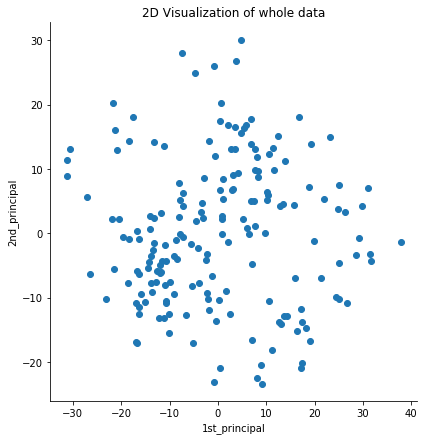

Shape OF Data after reducing components from 18465 to 2 :  (183, 2)


,1st_principal,2nd_principal
0,-10.896782,-1.765180
1,-4.133268,-2.222903
2,-11.495398,-4.291451
3,-3.988638,-7.678968
4,0.338806,6.675309


In [24]:
# attaching the label for each 2-d data point 

pca_data = np.vstack((pca.T)).T

# creating a new data fram which help us in ploting the result data
pca_df = pd.DataFrame(data=pca_data, columns=("1st_principal", "2nd_principal"))

sns.FacetGrid(pca_df, height=6).map(plt.scatter, '1st_principal', '2nd_principal')
plt.title("2D Visualization of whole data")
plt.show()
print("Shape OF Data after reducing components from 18465 to 2 : ",pca_df.shape)
pca_df.head()

### Let's look on `variance explained` by `2 principal components` of whole data

In [25]:
#The amount of variance that each PC explains
var= pcamodel.explained_variance_ratio_
print("Variance Explained by 1st_principal and 2nd_principal is : ",var)

Variance Explained by 1st_principal and 2nd_principal is :  [0.13746665 0.08399517]


In [26]:
#Cumulative Variance explains
var1=np.cumsum(np.round(pcamodel.explained_variance_ratio_, decimals=4)*100)

print ("Cumulative Variance Explained by 1st_principal and 2nd_principal is : ",var1b

Cumulative Variance Explained by 1st_principal and 2nd_principal is :  [13.75 22.15]


### OBSERVATION:
* `22.15%` variance explained by 2 principal components

### Check For `variance explained` by all `183 components`

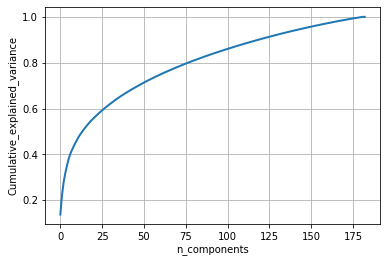

In [27]:
pcamodel = PCA(n_components=183)
pca = pcamodel.fit_transform(row_meta_data_quantile)

percentage_var_explained = pcamodel.explained_variance_ / np.sum(pcamodel.explained_variance_);

cum_var_explained = np.cumsum(percentage_var_explained)

# Plot the PCA spectrum
plt.figure(1, figsize=(6, 4))

plt.clf()
plt.plot(cum_var_explained, linewidth=2)
plt.axis('tight')
plt.grid()
plt.xlabel('n_components')
plt.ylabel('Cumulative_explained_variance')
plt.show()

### OBSERVATION :
* As we can see from above plot almost `90 % variance` is explained by almost `125 components`

`Visualize Data` using `different Samples`
--

In [28]:
# initializing the pca
from sklearn.decomposition import PCA

# configuring the parameteres
# the number of components = 2
pcamodel = PCA(n_components=2)
pca = pcamodel.fit_transform(row_meta_data_quantile)

# pca_reduced will contain the 2-d projects of simple data
print("shape of pca_reduced.shape = ", pca.shape)

shape of pca_reduced.shape =  (183, 2)


### Let see what analysis say about `alcohol_history_documented` feature

(183, 3)


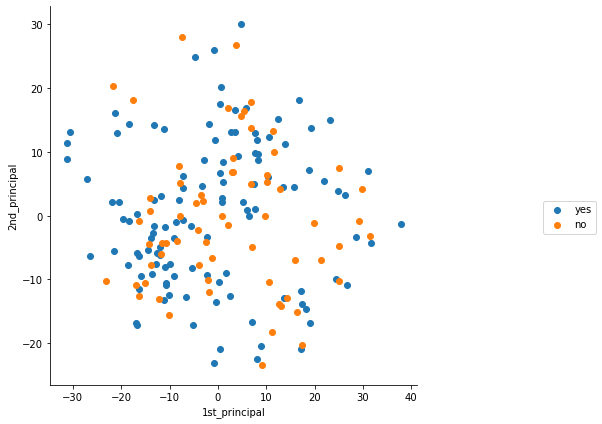

In [29]:
# attaching the label for each 2-d data point 
Y = column_meta_data_imputed["alcohol_history_documented"]
pca_data = np.vstack((pca.T, Y)).T
print(pca_data.shape)
# creating a new data fram which help us in ploting the result data
pca_df = pd.DataFrame(data=pca_data, columns=("1st_principal", "2nd_principal", "label"))
sns.FacetGrid(pca_df, hue="label", height=6).map(plt.scatter, '1st_principal', '2nd_principal')
plt.legend(loc='best',bbox_to_anchor=(1, 0., 0.5, 0.5))
plt.show()

### OBSERVATION
* More people have `alcoholic history`

### For `alcoholic_exposure_category`

(183, 3)


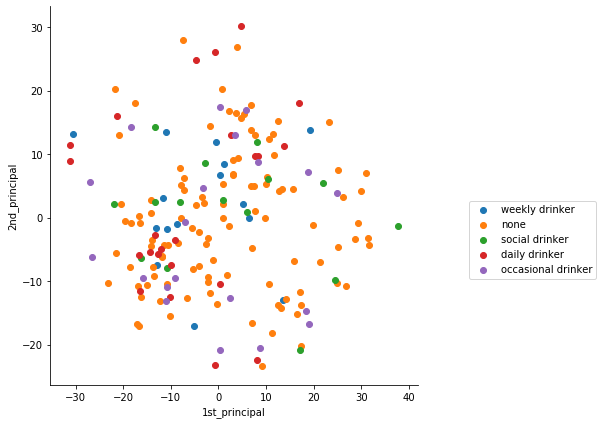

In [30]:
# attaching the label for each 2-d data point 
Y = column_meta_data_imputed["alcoholic_exposure_category"]
pca_data = np.vstack((pca.T, Y)).T
print(pca_data.shape)
# creating a new data fram which help us in ploting the result data
pca_df = pd.DataFrame(data=pca_data, columns=("1st_principal", "2nd_principal", "label"))
sns.FacetGrid(pca_df, hue="label", height=6).map(plt.scatter, '1st_principal', '2nd_principal')
plt.legend(loc='best',bbox_to_anchor=(1, 0., 0.5, 0.5))
plt.show()

### OBSERVATION:
* Many people comes under `none` category.
* Many people do not consume alcohol on daily basis

### For `anatomic_neoplasm_subdivision`

(183, 3)


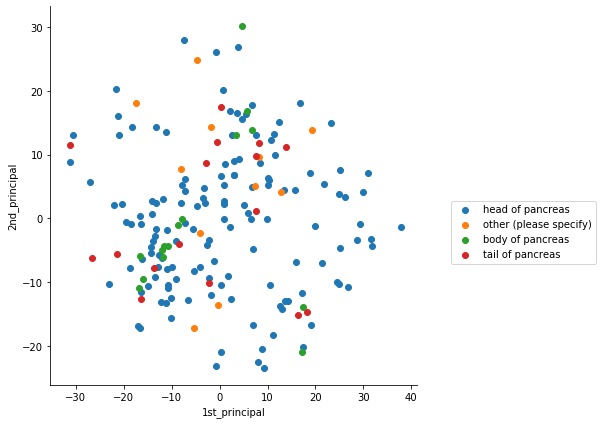

In [31]:
# attaching the label for each 2-d data point 
Y = column_meta_data_imputed["anatomic_neoplasm_subdivision"]
pca_data = np.vstack((pca.T, Y)).T
print(pca_data.shape)
# creating a new data fram which help us in ploting the result data
pca_df = pd.DataFrame(data=pca_data, columns=("1st_principal", "2nd_principal", "label"))
sns.FacetGrid(pca_df, hue="label", height=6).map(plt.scatter, '1st_principal', '2nd_principal')
plt.legend(loc='best',bbox_to_anchor=(1, 0., 0.5, 0.5))
plt.show()

### OBSERVATION 
* Many Pancreatic Cancer is on `Head of Pancreas`

### For `histologic_grading_tier_category`

(183, 3)


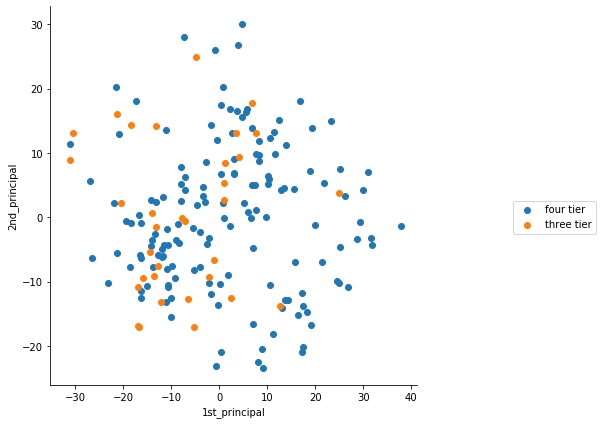

In [32]:
# attaching the label for each 2-d data point 
Y = column_meta_data_imputed["histologic_grading_tier_category"]
pca_data = np.vstack((pca.T, Y)).T
print(pca_data.shape)
# creating a new data fram which help us in ploting the result data
pca_df = pd.DataFrame(data=pca_data, columns=("1st_principal", "2nd_principal", "label"))
sns.FacetGrid(pca_df, hue="label", height=6).map(plt.scatter, '1st_principal', '2nd_principal')
plt.legend(loc='best',bbox_to_anchor=(1, 0., 0.5, 0.5))
plt.show()

### OBSERVATION
* Many are of `four tier`

### For `histological_type`

(183, 3)


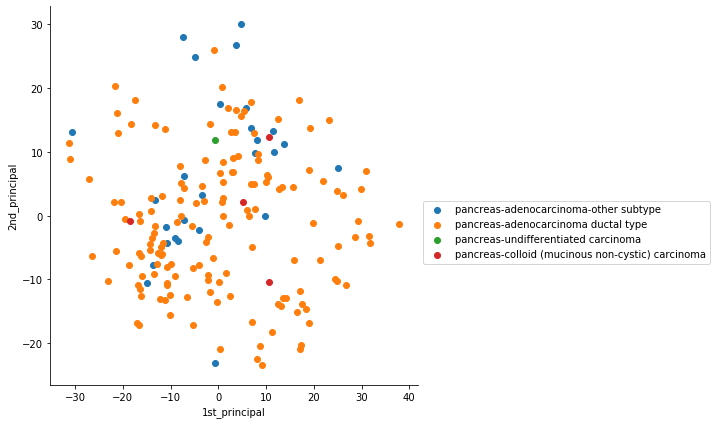

In [33]:
# attaching the label for each 2-d data point 
Y = column_meta_data_imputed["histological_type"]
pca_data = np.vstack((pca.T, Y)).T
print(pca_data.shape)
# creating a new data fram which help us in ploting the result data
pca_df = pd.DataFrame(data=pca_data, columns=("1st_principal", "2nd_principal", "label"))
sns.FacetGrid(pca_df, hue="label", height=6).map(plt.scatter, '1st_principal', '2nd_principal')
plt.legend(loc='best',bbox_to_anchor=(1, 0., 0.5, 0.5))
plt.show()

### OBSERVATION:
* Many tumors are pancreas adenocarcinoma `ductal type` which `most common type of exocrine tumors`.

### For `histological_type_other`

* In histological_type_other feature `many values are NAN` so `impute them` using `most_frequent value` and plot PCA in 2D

(183, 3)


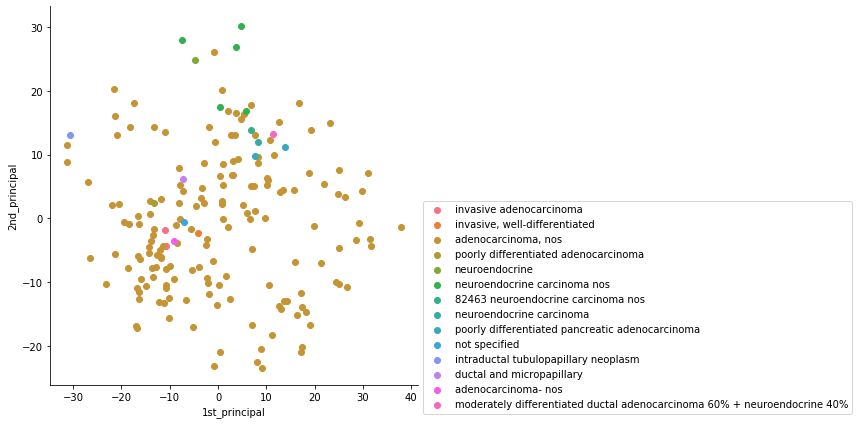

In [34]:
# attaching the label for each 2-d data point 
Y = column_meta_data_imputed["histological_type_other"]
pca_data = np.vstack((pca.T, Y)).T
print(pca_data.shape)
# creating a new data fram which help us in ploting the result data
pca_df = pd.DataFrame(data=pca_data, columns=("1st_principal", "2nd_principal", "label"))
sns.FacetGrid(pca_df, hue="label", height=6).map(plt.scatter, '1st_principal', '2nd_principal')
plt.legend(loc='best',bbox_to_anchor=(1, 0., 0.5, 0.5))
plt.show()

### OBSERVATIONS:
* Many pancreatic cancer is of `adenocarcinoma type` which is also `most common type` of pancreatic cancer. 
* Also `Neuroendocrine tumors and neuroendocrine carcinoma nos` are some `little seperable` from adenocarcinoma tumors

### For `history_of_chronic_pancreatitis`

(183, 3)


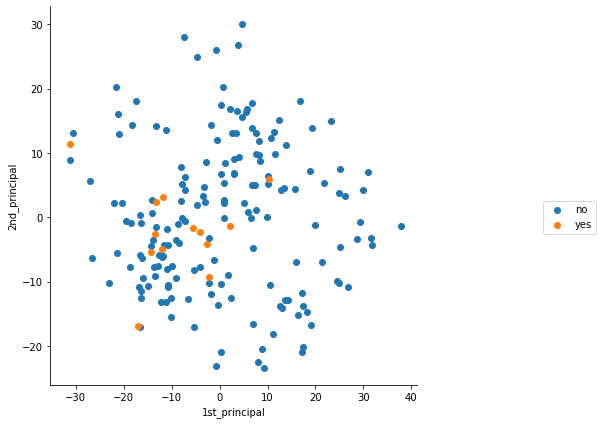

In [35]:
# attaching the label for each 2-d data point 
Y = column_meta_data_imputed["history_of_chronic_pancreatitis"]
pca_data = np.vstack((pca.T, Y)).T
print(pca_data.shape)
# creating a new data fram which help us in ploting the result data
pca_df = pd.DataFrame(data=pca_data, columns=("1st_principal", "2nd_principal", "label"))
sns.FacetGrid(pca_df, hue="label", height=6).map(plt.scatter, '1st_principal', '2nd_principal')
plt.legend(loc='best',bbox_to_anchor=(1, 0., 0.5, 0.5))
plt.show()

### OBSERVATIONS: 
* `Chronic pancreatitis` is `inflammation` of the pancreas that does not heal or improve—it gets worse over time and leads to permanent damage. 

2. `Many do not` have history of `Chronic pancreatitis`

### `Remove` the `neuroendocrine tumors` from the dataset so that it contains only the `adenocarcinoma tumor samples` and `Visualize data.`

In [38]:
column_meta_data_neuro_removed = column_meta_data_imputed.copy()

neuroendocrine = []
for val in column_meta_data_neuro_removed.histological_type_other:
    
    if(val == "neuroendocrine" or val == "neuroendocrine carcinoma nos" or val == "82463 neuroendocrine carcinoma nos" or val == "neuroendocrine carcinoma"):
        
        neuroendocrine.append(np.NaN)
        
    else:
        neuroendocrine.append(val)
column_meta_data_neuro_removed.histological_type_other =   neuroendocrine  


(183, 3)


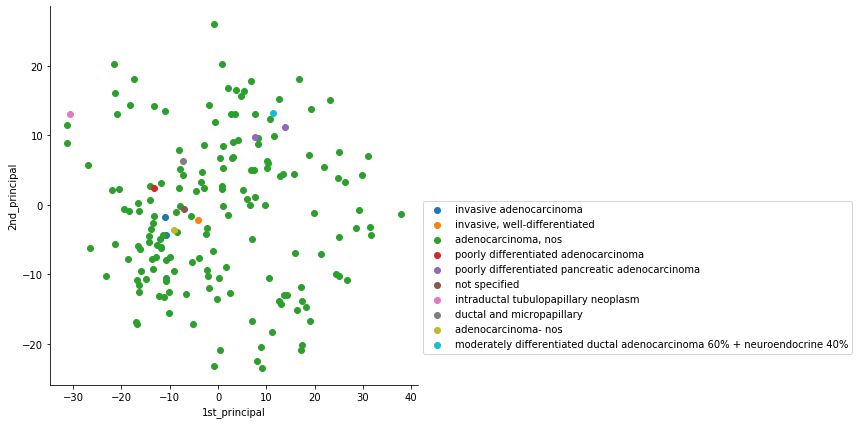

In [41]:
# attaching the label for each 2-d data point 
Y = column_meta_data_neuro_removed.histological_type_other
pca_data = np.vstack((pca.T, Y)).T
print(pca_data.shape)
# creating a new data fram which help us in ploting the result data
pca_df = pd.DataFrame(data=pca_data, columns=("1st_principal", "2nd_principal", "label"))
sns.FacetGrid(pca_df, hue="label", height=6).map(plt.scatter, '1st_principal', '2nd_principal')
plt.legend(loc='best',bbox_to_anchor=(1, 0., 0.5, 0.5))
plt.show()

Now Keep only the `adenocarcinoma-nos` tumors from the dataset so that it contains only the `adenocarcinoma tumor samples` and Visualize data.

In [39]:
column_meta_data_adeno = column_meta_data_imputed.copy()

adenocarcinoma = []
for val in column_meta_data_adeno.histological_type_other:
    
    if(val == "neuroendocrine" or val == "invasive adenocarcinoma" or val == "poorly differentiated pancreatic adenocarcinoma" or val == "invasive, well-differentiated" or val == "poorly differentiated adenocarcinoma" or val == "intraductal tubulopapillary neoplasm" or val == "moderately differentiated ductal adenocarcinoma 60% + neuroendocrine 40%" or val == "neuroendocrine carcinoma nos" or val == "82463 neuroendocrine carcinoma nos" or val == "neuroendocrine carcinoma" or val == "not specified" or val == "ductal and micropapillary"):
        
        adenocarcinoma.append(np.NaN)
        
    else:
        adenocarcinoma.append(val)
column_meta_data_adeno.histological_type_other =   adenocarcinoma  


### For `histological_type_other`

(183, 3)


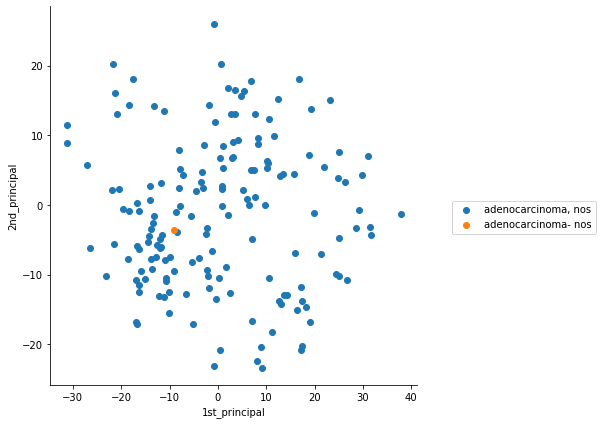

In [43]:
# attaching the label for each 2-d data point 
Y = column_meta_data_adeno.histological_type_other
pca_data = np.vstack((pca.T, Y)).T
print(pca_data.shape)
# creating a new data fram which help us in ploting the result data
pca_df = pd.DataFrame(data=pca_data, columns=("1st_principal", "2nd_principal", "label"))
sns.FacetGrid(pca_df, hue="label", height=6).map(plt.scatter, '1st_principal', '2nd_principal')
plt.legend(loc='best',bbox_to_anchor=(1, 0., 0.5, 0.5))
plt.show()

### OBSERVATIONS:
* After removing `Neuroendocrine tumors` we can see most of the type of tumors are of `adenocarcinoma tumor`

STEPS FOR TASK 2
==

* Running GSVA in Python: Run GSVA through the docker given for gsva python
https://github.com/jason-weirather/GSVA, https://hub.docker.com/r/vacation/gsva
* Visulising the  : Plotting 25 genes ( genes responsible for type 1 Interferons ) in homo sapiens using gene expression data for pancreatic adenocarcinoma. So we are use two column meta data here on is histology_type and other is histology_type other for for pancreatic adenocarcinoma only
* Distribution of IFN genes

In [27]:
# Load all 25 genes

ifn_genes = pd.read_csv("type1_IFN.txt",sep="\t",header=None )
ifn_genes.columns = ["genes"]
ifn_genes

,genes
0,IFIT1
1,IFI44
2,IFIT3
3,MX2
4,OAS1
5,OAS3
6,BST2
7,IFITM1
8,MX1
9,STAT1


#### Load `expression data`of these 25 genes and `plot PCA curves` for histology of tumors

In [29]:
ifn_gene_list = []
for val in ifn_genes.genes:
    
    ifn_gene_list.append(val)
    
print("Number of type 1 ifn genes",len(ifn_gene_list))

ifn_gene_df = row_meta_data_logScale[ifn_gene_list]
ifn_gene_df

Number of type 1 ifn genes 25


rid,IFIT1,IFI44,IFIT3,MX2,OAS1,OAS3,BST2,IFITM1,MX1,STAT1,...,IFIT2,IFITM2,IRF1,IRF9,IRGM,ISG15,OAS2,PSME1,SOCS1,STAT2
cid,,,,,,,,,,,,,,,,,,,,,
aab1-Primary solid Tumor,3.247927,3.232661,3.321928,3.292782,3.548437,3.498251,3.608809,3.485427,3.523562,3.608809,...,3.104337,3.485427,3.432960,3.510962,-1.000000,3.548437,3.523562,3.620586,2.944858,3.485427
aab4-Primary solid Tumor,3.392318,3.472488,3.432960,3.419539,3.459432,3.572890,3.666757,3.689299,3.632268,3.666757,...,3.153805,3.620586,3.485427,3.510962,1.431830,3.548437,3.459432,3.620586,2.887525,3.498251
aab6-Primary solid Tumor,3.608809,3.485427,3.536053,3.459432,3.498251,3.584962,3.666757,3.643856,3.655352,3.689299,...,3.392318,3.498251,3.292782,3.510962,1.443176,3.797013,3.560715,3.584962,2.981853,3.584962
aab8-Primary solid Tumor,3.419539,3.405993,3.364573,3.432960,3.392318,3.459432,3.572890,3.584962,3.689299,3.643856,...,3.232661,3.620586,3.378511,3.432960,2.926040,3.560715,3.510962,3.548437,2.765535,3.548437
aab9-Primary solid Tumor,3.104337,3.137504,3.169925,3.053111,3.201634,3.277985,3.378511,3.405993,3.364573,3.536053,...,3.053111,3.572890,3.350497,3.405993,2.926040,3.277985,3.185867,3.548437,2.887525,3.472488
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
a89d-Solid Tissue Normal,3.070389,3.153805,3.185867,3.217231,3.392318,3.336283,3.608809,3.572890,3.459432,3.523562,...,3.035624,3.643856,3.378511,3.378511,1.995936,3.446256,3.336283,3.572890,2.847997,3.498251
a89d-Primary solid Tumor,3.247927,3.217231,3.263034,3.321928,3.446256,3.378511,3.643856,3.572890,3.485427,3.560715,...,3.153805,3.608809,3.378511,3.364573,-0.736966,3.498251,3.392318,3.584962,2.847997,3.472488
a8sy-Primary solid Tumor,3.378511,3.405993,3.392318,3.510962,3.472488,3.472488,3.689299,3.608809,3.655352,3.608809,...,3.153805,3.548437,3.419539,3.392318,2.926040,3.666757,3.498251,3.523562,2.867897,3.560715


In [46]:
# Quantile transform the 25 gene data 

from sklearn.preprocessing import quantile_transform

ifn_gene_data_quantile = quantile_transform(ifn_gene_df, n_quantiles=10, random_state=0, copy=True)
ifn_gene_data_quantile

array([[0.59298164, 0.55166864, 0.63851285, ..., 0.85026896, 0.8005734 ,
        0.5555556 ],
       [0.8394851 , 0.91935915, 0.86708057, ..., 0.85026896, 0.7229731 ,
        0.6666667 ],
       [0.98264027, 0.92640454, 0.9502683 , ..., 0.6666667 , 0.84529036,
        0.93929327],
       ...,
       [0.8144286 , 0.8727078 , 0.8004218 , ..., 0.18550755, 0.6950128 ,
        0.90817696],
       [0.91511613, 0.8978357 , 0.8450689 , ..., 0.9138109 , 0.17889225,
        0.27803558],
       [0.7669621 , 0.9050758 , 0.7040663 , ..., 0.80020934, 0.91811866,
        0.8924204 ]], dtype=float32)

###  Plot `PCA` for above `25 gene expression data` on top of histology of tumors

In [47]:
# initializing the pca
from sklearn.decomposition import PCA

# configuring the parameteres
# the number of components = 2
pcamodel = PCA(n_components=2)
pca = pcamodel.fit_transform(ifn_gene_data_quantile)

# pca_reduced will contain the 2-d projects of simple data
print("shape of pca_reduced.shape = ", pca.shape)

shape of pca_reduced.shape =  (183, 2)


### For `histological_type`

(183, 3)


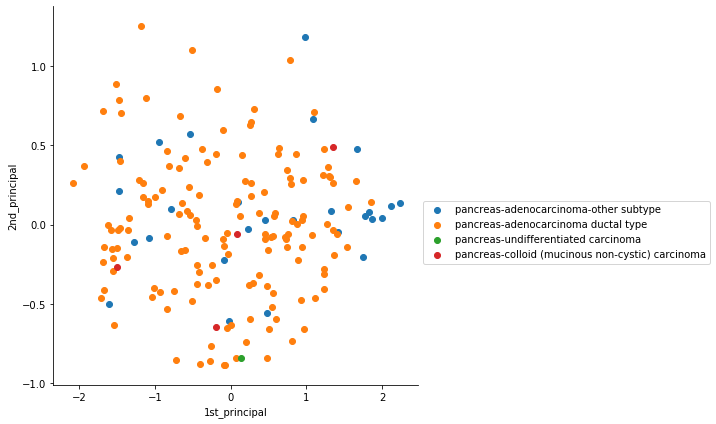

In [48]:
# attaching the label for each 2-d data point 
Y = column_meta_data_imputed.histological_type
pca_data = np.vstack((pca.T, Y)).T
print(pca_data.shape)
# creating a new data fram which help us in ploting the result data
pca_df = pd.DataFrame(data=pca_data, columns=("1st_principal", "2nd_principal", "label"))
sns.FacetGrid(pca_df, hue="label", height=6).map(plt.scatter, '1st_principal', '2nd_principal')
plt.legend(loc='best',bbox_to_anchor=(1, 0., 0.5, 0.5))
plt.show()

### OBSERVATIONS:
* For these 25 genes of `Type 1 IFN signature` above plot shows most of `pancreatic-adenocarcinoma cancer is of ductal type`.

### For `histological_type_other` : After removing Neuroendocrine tumors data

(183, 3)


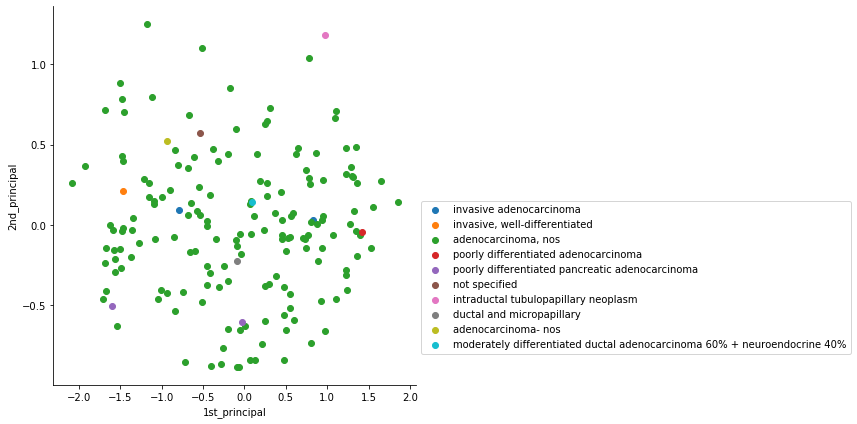

In [50]:
# attaching the label for each 2-d data point 
Y = column_meta_data_neuro_removed.histological_type_other
pca_data = np.vstack((pca.T, Y)).T
print(pca_data.shape)
# creating a new data fram which help us in ploting the result data
pca_df = pd.DataFrame(data=pca_data, columns=("1st_principal", "2nd_principal", "label"))
sns.FacetGrid(pca_df, hue="label", height=6).map(plt.scatter, '1st_principal', '2nd_principal')
plt.legend(loc='best',bbox_to_anchor=(1, 0., 0.5, 0.5))
plt.show()

### For histological_type_other : After keep `only Adenocarcinoma NOS` tumors data

(183, 3)


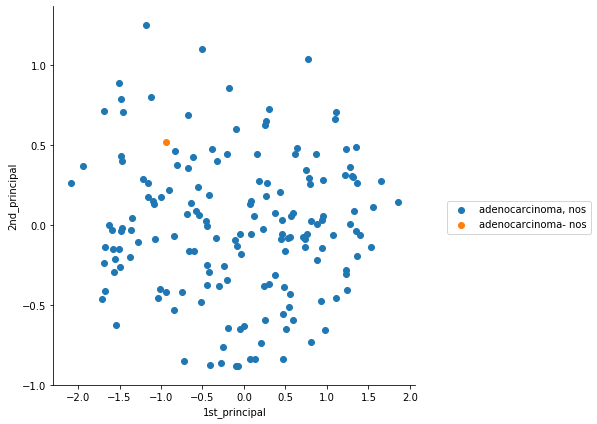

In [51]:
# attaching the label for each 2-d data point 
Y = column_meta_data_adeno.histological_type_other
pca_data = np.vstack((pca.T, Y)).T
print(pca_data.shape)
# creating a new data fram which help us in ploting the result data
pca_df = pd.DataFrame(data=pca_data, columns=("1st_principal", "2nd_principal", "label"))
sns.FacetGrid(pca_df, hue="label", height=6).map(plt.scatter, '1st_principal', '2nd_principal')
plt.legend(loc='best',bbox_to_anchor=(1, 0., 0.5, 0.5))
plt.show()

### Applying` GSVA `[Gene Set variation Analysis]

In [52]:
#expression_df = row_meta_data_logScale.drop(columns = ifn_gene_list)
#expression_df = expression_df.T
expression_df = row_meta_data_logScale.T
print("Shape of expression data",expression_df.shape)

ifn_genes.columns = ["member"]
ifn_genes["name"] = ifn_genes.member
print("Shape of genes",ifn_genes.shape)
ifn_genes

Shape of expression data (18465, 183)
Shape of genes (25, 2)


,member,name
0,IFIT1,IFIT1
1,IFI44,IFI44
2,IFIT3,IFIT3
3,MX2,MX2
4,OAS1,OAS1
5,OAS3,OAS3
6,BST2,BST2
7,IFITM1,IFITM1
8,MX1,MX1
9,STAT1,STAT1


In [53]:
# Applying Gene Set variation Analysis (GSVA)
pathways_df = gsva(expression_df,ifn_genes)
pathways_df

,aab1-Primary solid Tumor,aab4-Primary solid Tumor,aab6-Primary solid Tumor,aab8-Primary solid Tumor,aab9-Primary solid Tumor,aaba-Primary solid Tumor,aabe-Primary solid Tumor,aabf-Primary solid Tumor,aabh-Primary solid Tumor,aabi-Primary solid Tumor,...,aauh-Primary solid Tumor,aaui-Primary solid Tumor,aaul-Primary solid Tumor,a8t3-Primary solid Tumor,a8t5-Primary solid Tumor,a89d-Solid Tissue Normal,a89d-Primary solid Tumor,a8sy-Primary solid Tumor,a8lh-Primary solid Tumor,aapl-Primary solid Tumor
name,,,,,,,,,,,,,,,,,,,,,
BST2,0.698549,0.921252,0.795602,0.448873,-0.867418,-0.480719,0.332539,0.169844,-0.910637,-0.305676,...,-0.405546,-0.560009,0.444541,-0.539320,0.465880,0.682951,0.910312,0.922552,0.982994,0.118176
CXCL10,0.931001,0.805243,0.691183,0.147205,-0.215663,-0.957756,-0.755308,0.955373,-0.287912,-0.454073,...,-0.536937,-0.866984,-0.543869,0.853120,-0.507366,-0.342396,0.652621,0.664428,-0.554376,0.505849
IFI16,-0.694541,-0.365360,0.800477,0.896447,-0.598029,-0.602903,0.926885,0.141681,-0.722812,-0.346295,...,0.167894,0.028921,-0.620884,-0.193349,0.352145,0.585572,-0.430676,0.624458,-0.693891,0.861460
IFI27,0.766031,0.880741,0.895039,0.580914,-0.249242,-0.787695,0.205373,0.512782,-0.365035,-0.900997,...,-0.771231,-0.085789,0.798960,-0.709380,-0.390923,0.211980,0.564666,0.931976,0.959164,-0.082647
IFI30,-0.295494,0.278163,0.159120,-0.041269,-0.189341,-0.786179,0.509099,0.870776,-0.078964,-0.483211,...,-0.612652,-0.587630,0.423419,-0.393523,-0.548310,0.995559,0.417461,0.267764,-0.769497,0.149913
IFI44,0.168111,0.974437,0.914103,0.840013,-0.558601,-0.736244,-0.237543,0.983427,-0.565100,-0.655221,...,-0.794952,-0.911503,0.498484,0.548094,-0.059250,-0.310767,0.004224,0.810334,0.822249,0.737435
IFIH1,0.233752,0.909012,0.825607,0.818133,0.197682,-0.838388,0.356911,0.990035,0.067374,-0.341638,...,-0.683925,-0.670927,-0.256824,-0.279896,-0.059142,-0.438367,0.362327,0.187933,0.841746,0.526538
IFIT1,0.319866,0.825065,0.973354,0.837955,-0.459055,-0.960789,-0.032604,0.983969,-0.371642,-0.706889,...,-0.567158,-0.943999,0.381932,-0.459597,0.114926,-0.443349,0.293544,0.711438,0.860919,0.440641
IFIT2,-0.002491,0.313367,0.958189,0.768523,-0.460572,-0.949740,-0.670819,0.993176,-0.108427,-0.357994,...,-0.896122,-0.834055,0.107127,-0.198332,0.652946,-0.399805,0.342396,0.296794,0.069541,0.335355


### Visualize Whole Data after applying `GSVA` for 25 gene set using `TSNE `dimensonality reduction algorithm

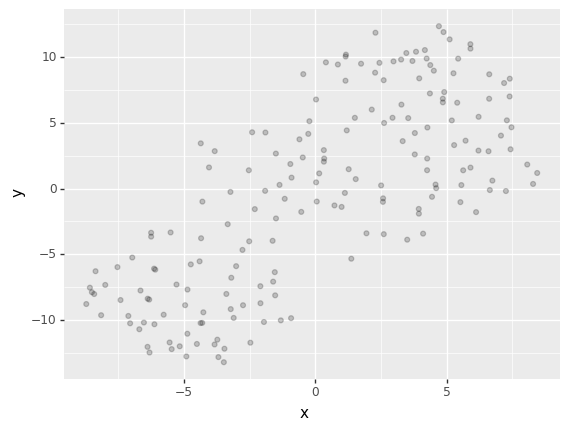

<ggplot: (129877019221)>

In [54]:
YV = TSNE(n_components=2).\
    fit_transform(pathways_df.T)
pf = pd.DataFrame(YV).rename(columns={0:'x',1:'y'})

(ggplot(pf,aes(x='x',y='y'))
 + geom_point(alpha=0.2)
)

### For `histological_type_other` including `neuroendocrine tumors`

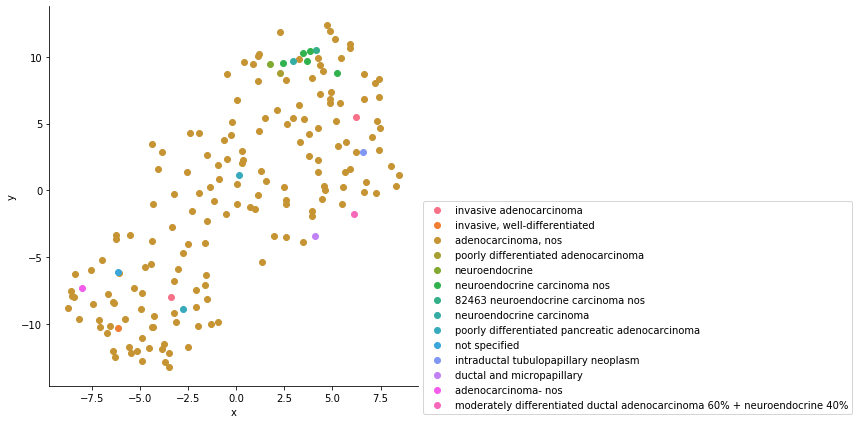

In [55]:
Y = column_meta_data_imputed["histological_type_other"]
pca_data = np.vstack((YV.T, Y)).T
pf = pd.DataFrame(pca_data).rename(columns={0:'x',1:'y',2:'label'})
sns.FacetGrid(pf, hue="label", height=6).map(plt.scatter, 'x', 'y')
plt.legend(loc='best',bbox_to_anchor=(1, 0., 0.5, 0.5))
plt.show()

### For histological_type_other `excluding neuroendocrine tumors`

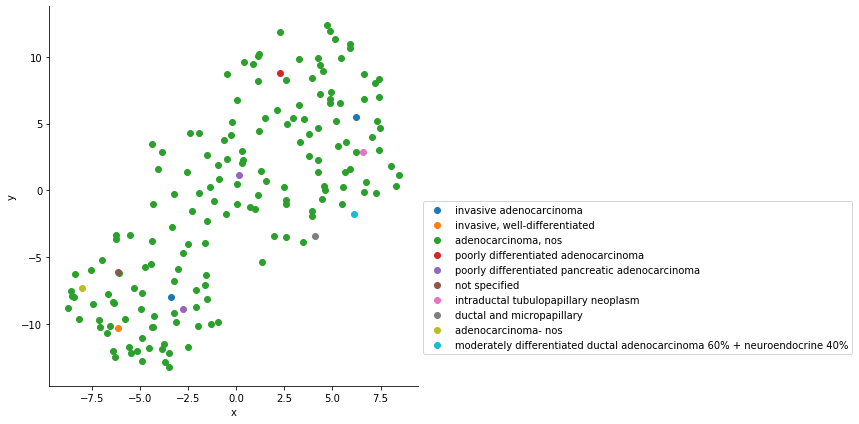

In [56]:
Y = column_meta_data_neuro_removed["histological_type_other"]
pca_data = np.vstack((YV.T, Y)).T
pf = pd.DataFrame(pca_data).rename(columns={0:'x',1:'y',2:'label'})
sns.FacetGrid(pf, hue="label", height=6).map(plt.scatter, 'x', 'y')
plt.legend(loc='best',bbox_to_anchor=(1, 0., 0.5, 0.5))
plt.show()


### For histological_type_other `keep only adenocarcinoma nos tumors`

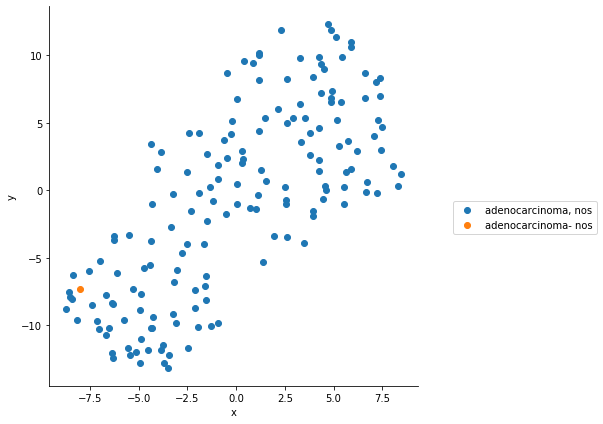

In [57]:
Y = column_meta_data_adeno["histological_type_other"]
pca_data = np.vstack((YV.T, Y)).T
pf = pd.DataFrame(pca_data).rename(columns={0:'x',1:'y',2:'label'})
sns.FacetGrid(pf, hue="label", height=6).map(plt.scatter, 'x', 'y')
plt.legend(loc='best',bbox_to_anchor=(1, 0., 0.5, 0.5))
plt.show()

### OBSERVATIONS:
* Most of type of tumors are adenocarcinoma-nos type

### `Null values` in `column data(adeno only)` in `histological_type_other`.

In [71]:
column_meta_data_adeno.histological_type_other.isnull().sum()

18

### Negative values in `IFN genes`

In [73]:
data = meta_data.data_df.T[~column_meta_data_adeno.histological_type_other.isnull()][ifn_gene_list]

In [74]:
(data[ifn_gene_list].isnull().sum() + (data[ifn_gene_list]<= 0).sum())

rid
IFIT1       0
IFI44       0
IFIT3       0
MX2         0
OAS1        0
OAS3        0
BST2        0
IFITM1      0
MX1         0
STAT1       0
IFI27       0
CXCL10      1
IFI16       0
IFI30       0
IFIH1       0
IFIT2       0
IFITM2      0
IRF1        0
IRF9        0
IRGM      107
ISG15       0
OAS2        0
PSME1       0
SOCS1       0
STAT2       0
dtype: int64

### OBSERVATIONS:
* `IRGM` gene of IFN type have `nan` and `negative values`.
* `CXCL10` has 2 negative values 

### `PDF` of `all gene` present in `IFN`

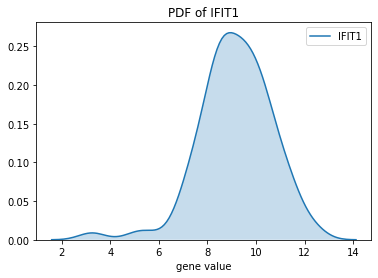

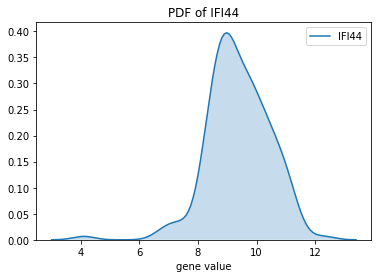

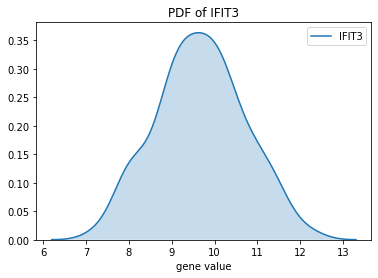

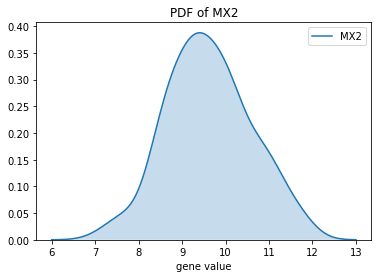

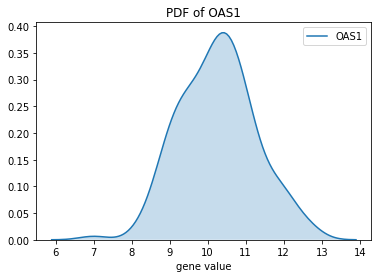

...

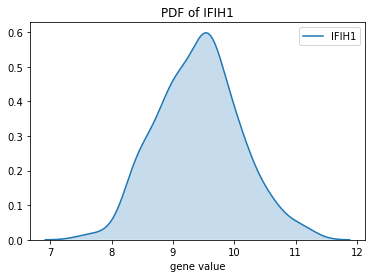

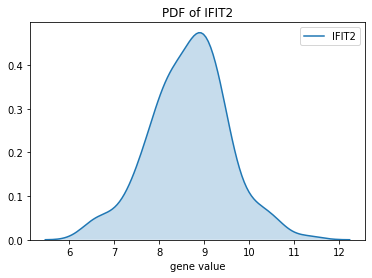

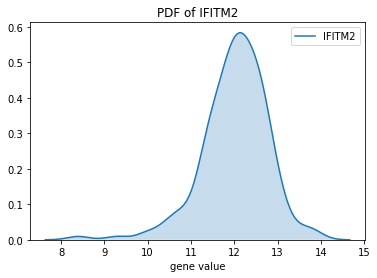

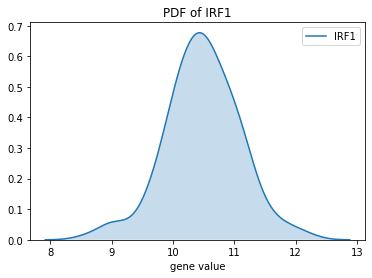

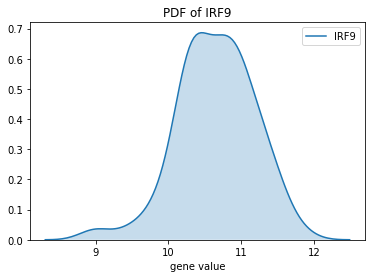

C:\Users\Tarun Makkar\AppData\Roaming\Python\Python37\site-packages\statsmodels\nonparametric\kde.py:547: RuntimeWarning: invalid value encountered in greater
C:\Users\Tarun Makkar\AppData\Roaming\Python\Python37\site-packages\statsmodels\nonparametric\kde.py:547: RuntimeWarning: invalid value encountered in less


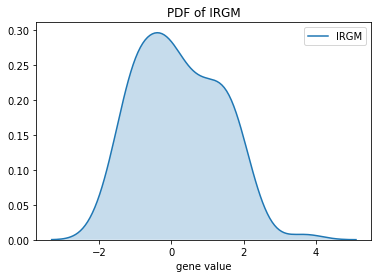

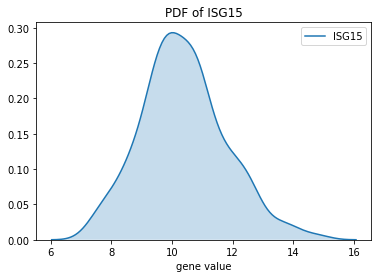

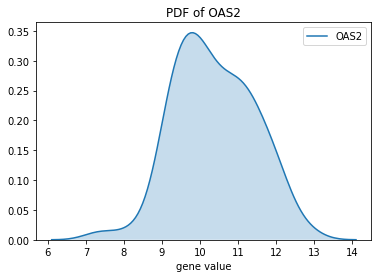

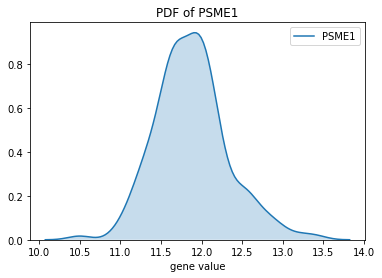

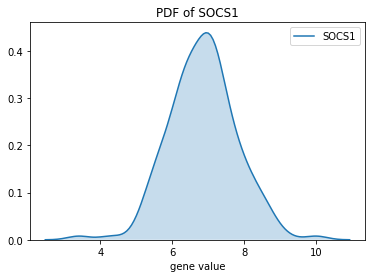

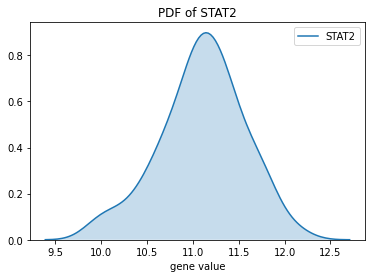

In [75]:
for col in data.columns:
    if col in ifn_gene_list:
        sns.kdeplot(data[col],shade=True)
        plt.xlabel('gene value')
        plt.title('PDF of '+col);
        plt.show();

### OBSERVATIONS:
* All genes show similar observations except `IRGM` and `CXCL10`